In [1]:
%load_ext autoreload
%autoreload 2
import numpy as np
import matplotlib.pylab as plt
import matplotlib.colors as colors
import matplotlib.patches as patches
import torchvision
import matplotlib.patches as patches
from sklearn.cluster import KMeans
from sklearn.manifold import TSNE
import matplotlib.gridspec as gridspec
from mpl_toolkits.mplot3d import Axes3D

import os
import time
import torch
import sys
import argparse
sys.path.insert(0, '../../shared_code')
from model_loader_func import * 
from dataloader_func import *
from quality_metrics_func import *
from linear_approx import *
from inverse_tasks_func import synthesis
from plotting_func import *
from algorithm_inv_prob import * 
from trainer import make_loader
%matplotlib inline

In [2]:
print(torch.__version__)
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
device

2.5.0+cu124


device(type='cuda')

In [3]:
compute_UNet_RF(num_enc_conv=[2,2,2,2],  num_mid_conv=3, kernel_size=3)

172

# functions 

In [4]:
## plotting stuff: 
noise_colormap = plt.cm.copper 
scale_colormap = plt.cm.seismic


In [5]:
similarity_matrix = lambda data : data/data.norm(dim = 1, keepdim=True) @(data/data.norm(dim = 1, keepdim=True)).T
similarity_vactor = lambda data, v : (v/(v.norm(dim = 1, keepdim=True)+1e-6) @(data/(data.norm(dim = 1, keepdim=True) +1e-6 ) ).T).flatten()

degree_matrix = lambda sim_mat : torch.diag(sim_mat.sum(dim = 1))

participation_ratio = lambda v :  (v.norm(1)**2)/v.norm(2)**2/len(v)
participation_ratio_dataset = lambda data :  (data.norm(1, dim = 1)**2)/data.norm(2,dim = 1)**2/data.shape[1]


# Load denoisers 

In [74]:
denoisers = {}

root_path = '/mnt/home/zkadkhodaie/ceph/22_representation_in_UNet_denoiser/denoisers/'

paths = {                
             'mixture-color-deep-no-skip' : 'UNet_flex/imagenet/0to255_RF_84x84_set_size_1232457_color_no_skip_deep_dec_64x64/',

         'mixture-color-deep-no-skip-full':'UNet_flex/imagenet/0to255_RF_84x84_set_size_1281167_color_no_skip_deep_dec_full_64x64/',
    
         'mixture-color-deep-no-skip-subset':'UNet_flex/imagenet/0to255_RF_84x84_set_size_256954_color_no_skip_deep_dec_subset_64x64/',    

        }

groups = paths.keys()


for group in groups: 
    path = root_path + paths[group]
    
    print('loading group ' , group )
    if 'modified' in group.split('-'):
        new_arch = 'UNet_conditional_mean_matching'
    else: 
        new_arch = None
    denoisers[group] = load_learned_model(path, print_args=True, new_arch=new_arch)
    start_time_total = time.time()        
    print("--- %s seconds ---" % (round(time.time() - start_time_total)))
     

loading group  mixture-color-deep-no-skip
*************** saved arguments:*************
arch_name UNet_flex
lr 0.001
batch_size 1024
num_epochs 1500
lr_freq 100
loss_weight False
noise_level_range [0, 255]
quadratic_noise True
rescale False
swap False
set_size 1232457
imagenet_subset_ids None
data_name imagenet
data_root_path /mnt/home/zkadkhodaie/ceph/datasets/
dir_name /mnt/home/zkadkhodaie/ceph/21_hierarchical_conditional_prior/denoisers/UNet_flex/imagenet/0to255_RF_84x84_set_size_1232457_color_no_skip_deep_dec_64x64
optional_dir_label color_no_skip_deep_dec
device cuda
debug False
kernel_size 3
padding 1
skip False
num_channels 3
bias True
RF 84
coarse True
self_cond False
num_kernels [64, 128, 256, 512]
num_blocks 3
num_enc_conv [2, 2, 2]
num_mid_conv 3
num_dec_conv [6, 6, 6]
NormType LayerNorm
inter_skip True
dilations None
data_path /mnt/home/zkadkhodaie/ceph/datasets/imagenet
******************************************************
number of parameters is  13125187
train mode: Fa

In [75]:
denoisers.keys()

dict_keys(['mixture-color-deep-no-skip', 'mixture-color-deep-no-skip-full', 'mixture-color-deep-no-skip-subset'])

In [8]:
layers = {}
for group in groups:
    layers[group] = []
    for i in range(len(denoisers[group].encoder)):
        layers[group].append(denoisers[group].encoder[str(i) ][0].weight.shape[0])
    
    layers[group].append(denoisers[group].mid[0].weight.shape[0])
    
    for i in range(len(denoisers[group].decoder)-1 , 0, -1):
        layers[group].append(denoisers[group].decoder[str(i) ][0].weight.shape[0])


layers

{'mixture-color-deep-no-skip-full': [64, 128, 256, 512, 256, 128],
 'mixture-color-deep-no-skip-subset': [64, 128, 256, 512, 256, 128]}

In [9]:
block_names = {}
for group in groups: 
    block_names[group] = []
    for l in range(int(len(layers[group])/2)): 
        block_names[group].append('enc' + str(l))
    block_names[group].append('mid'  )        
    for l in range(int(len(layers[group])/2)-1, 0,-1):
        block_names[group].append('dec' + str(l) )
block_names   

{'mixture-color-deep-no-skip-full': ['enc0',
  'enc1',
  'enc2',
  'mid',
  'dec2',
  'dec1'],
 'mixture-color-deep-no-skip-subset': ['enc0',
  'enc1',
  'enc2',
  'mid',
  'dec2',
  'dec1']}

# Load datasets 

In [11]:
time0 = time.time()
test_sets = torch.load( '/mnt/home/zkadkhodaie/ceph/datasets/imagenet/validation_color_full_64x64_list.pt', weights_only=True) 
print(f"loading time: {time.time() - time0} seconds ")

loading time: 31.125247478485107 seconds 


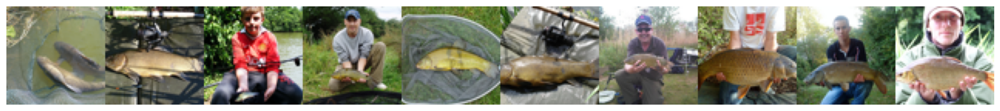

In [12]:
show_im_grid(test_sets[0][0:10] )


In [13]:
print('number of images in each class:', test_sets[0].shape)
K = test_sets[0].shape[2]
n_channels = test_sets[0].shape[1]
print(len(test_sets))

number of images in each class: torch.Size([50, 3, 64, 64])
1000


tensor(0.4424)


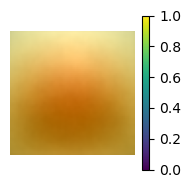

In [14]:
dist_mean = torch.concatenate(test_sets).mean(dim = (0))
plot_single_im(dist_mean, colorbar=True)
print(dist_mean.mean())

In [15]:
dist_mean.mean(dim = (1,2), keepdim = True)

tensor([[[0.4764]],

        [[0.4504]],

        [[0.4005]]])

In [16]:
test_sets_cat = torch.concatenate(test_sets)
test_sets_cat.shape

torch.Size([50000, 3, 64, 64])

In [17]:
imagenet_subset_ids= torch.tensor([580, 172, 199, 396, 906, 221, 740, 845, 455, 201, 887, 673, 814,  81,
        678, 961, 839,  29, 879,  82, 974, 427, 721, 310, 530, 504, 312, 748,
        291, 600, 459, 484, 741, 712, 301, 621, 702, 769, 193, 282, 805, 680,
        422, 145,  50, 258, 787, 177, 960, 726, 437, 585, 624, 178, 790, 236,
        237, 197, 186, 121, 656, 801, 823, 133, 923, 804, 505, 674, 419, 606,
        880, 179, 827, 294, 376, 160, 433, 143, 467, 238, 454, 793, 107, 285,
        441, 519, 468, 346, 777,  57, 746, 187, 720, 185, 770, 475, 947, 595,
        314, 118, 173, 857, 892, 805, 243, 693, 388, 484, 602, 101, 932, 565,
        145, 710, 958,  33, 863, 861, 561, 212, 717, 594, 553, 645, 417, 311,
         29, 495, 395, 495, 416, 211, 307,  96, 794, 417, 330, 880, 910, 735,
        479, 282, 189, 777, 959, 779, 523, 829, 820, 705, 608, 947, 797, 407,
        905, 257,  74,  96, 760, 869, 348, 403, 763,  46, 794, 532, 766, 801,
        290,  11,  19, 802, 915, 334, 891, 740, 207, 221, 776, 910, 231, 281,
        746, 938, 220, 241, 896, 856, 832, 666, 844, 142, 997, 828, 365, 601,
        109, 209, 614, 274])


my_ims = torch.cat([test_sets[i][0:1] for i in imagenet_subset_ids ])
print(len(my_ims))
# show_im_grid(my_ims, n_columns=20)

test_sets_sub = [test_sets[i] for i in imagenet_subset_ids ]
print(torch.cat(test_sets_sub).shape)


200
torch.Size([10000, 3, 64, 64])



$\phi(y)$ or the mean of the channel is a function of noise realization, noise level, and input image. 

- **noise realization**: We take the average of $\phi(y)$ at a noise level, for one image to remove the effect of noise realization. 

- **noise level**: We observe that the $\phi(y_{\sigma})$ and $\phi(y_{\sigma})$ at two different noise levels are highly related: first, active channels are mostly shared at different noise levels. Specially at intermediate and larger noise levels. There are more active channels at high noise levels and they include active channels at smaller noise levels. Second, they are highly correlated. That means they are aligned and differ by a poitive scalre value.

- **input image $x$**: after getting rid of noise effect, we can look at how $\phi(y)$ changes from image to image. We can interpret $\phi(y)$ as a good approximation of $\phi(x)$. Now we ask if  Euclidean distance in latent space $\Vert \phi(x_1) -  \phi(x_2) \Vert_2$ is meaningfully related to $\mathcal{D}(x_1, x_2)$ where $\mathcal{D}$ is a some distance metric between the two images. Since $\phi(x)$ is a many to one mapping, we can define a distance between the density of all images mapping to $\phi(x_1)$ and the density of all images mapping to $\phi(x_2)$, that is $\mathcal{D}( p(x|\phi(x_1), p(x|\phi(x_2)) )$. 

# Compare denoising performance 

In [78]:
## compute psnr 
sig_range = torch.logspace(.01,4,15)

psnr_test = {}
# psnr_train = {}
for group in groups: 

    ## train 
    print(group)
    if 'gray' in group.split('-'): 
        loader = DataLoader(dataset=my_ims.mean(dim =1, keepdim=True), batch_size=512, shuffle=False)
    else: 
        loader = DataLoader(dataset=my_ims, batch_size=512, shuffle=False)
            
    try: 
        psnr_test[group] = calc_psnr(denoisers[group],loader,sig_range, device, skip=False)
    except KeyError: 
        pass


mixture-color-deep-no-skip
mixture-color-deep-no-skip-full
mixture-color-deep-no-skip-subset


mixture-color-deep-no-skip
mixture-color-deep-no-skip-full
mixture-color-deep-no-skip-subset


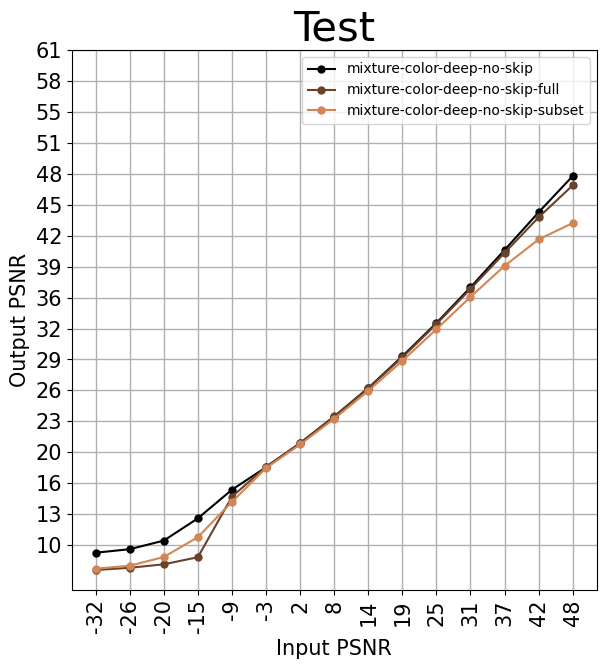

In [79]:
## plot 
f , axs = plt.subplots(1,1, figsize=(6,6), sharex = True, sharey=True)
plt.tight_layout()
x_axis = [ -10*np.log10( (float(std)/255)**2  ) for std in psnr_test[group].keys()]

for group in groups: 
    print(group)
    if 'color' in group.split('-'):
        ## test 
        axs.plot(x_axis, [psnr_test[group][key] for key in psnr_test[group].keys()], 
                    marker = '.',markersize = 10,label =  group , alpha = 1)

axs.set_xticks(x_axis);
axs.grid(  linewidth=1);
axs.set_xticklabels(np.round(x_axis).astype(int) ,rotation=90, fontsize=15)
# axs.set_xlim(-3, 45)

y_axis = np.linspace(10,61,17) 
axs.set_yticks(y_axis);
axs.set_yticklabels(np.round(y_axis).astype(int) , fontsize=15);
# axs.set_ylim(18, 45)


colormap = plt.cm.copper #nipy_spectral, Set1,Paired   
plot_colors = [colormap(i) for i in np.linspace(0, 1, 3+1)]
for k,j in enumerate(axs.lines):
    j.set_color(plot_colors[k])
# axs.plot(x_axis, [ -10*np.log10( (std/255)**2  ) for std in sig_range/K ],linestyle = 'dotted', label = 
            # 'expected from 1d manifold(N=1)', color='gray')
# axs.plot( [0,65],[0,65] ,'k--', alpha = .7, label = 'identity');
axs.legend(fontsize = 10);
axs.set_title('Test', fontsize = 30)
axs.set_xlabel('Input PSNR', fontsize = 15)
axs.set_ylabel('Output PSNR', fontsize = 15);


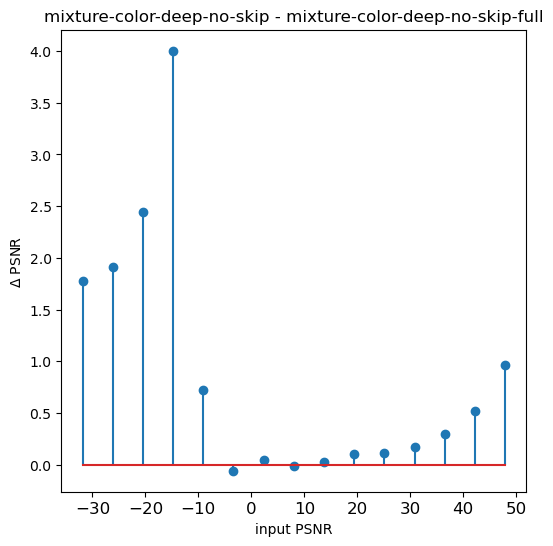

In [80]:
denoiser1 =  'mixture-color-deep-no-skip'
denoiser2 = 'mixture-color-deep-no-skip-full'
f , axs = plt.subplots(1,1, figsize=(6,6), sharex = True, sharey=True)

axs.stem(x_axis,[psnr_test[denoiser1][key] - psnr_test[denoiser2][key] for key in psnr_test[group].keys()])
axs.set_xlabel('input PSNR')
axs.set_title(denoiser1+ ' - '+ denoiser2)
axs.set_ylabel('$\Delta$ PSNR');


#  Noise dependence of $\phi$

## 1.1) What is the variance of $\phi_{\sigma}(y)$ at a given $\sigma$ (Variance due to noise realization stochasticity)

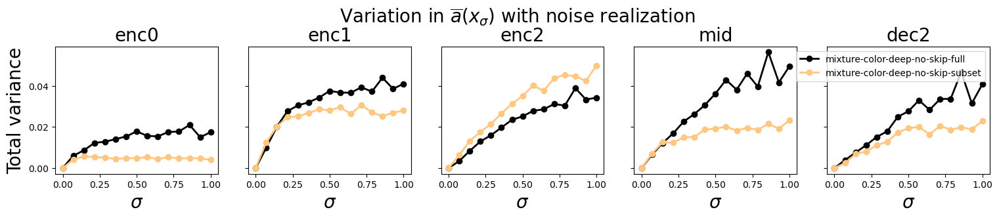

In [24]:
plot_colors = [noise_colormap(i) for i in np.linspace(0, 1,len(groups))]

f, axs = plt.subplots(1,5, figsize = (15,3), sharey=True, sharex=True)
f.suptitle('Variation in $\overline{a}(x_{\sigma})$ with noise realization', fontsize = 20)
# 
plt.tight_layout()
i = 0
for group in groups:
    # group = 'mixture-color'
    
    sigmas = torch.linspace(0,1, 15)
    
    ids = torch.randint(0, test_sets_cat.shape[0], size = (1,))
    all_phis = []
    for sig in sigmas:
        all_phis.append(phi_c_many_noise(denoisers[group], test_sets_cat[ids], sigs=torch.ones(len(ids),1,1,1) * sig , n_noise= 10 ))
        
    
    ### plot 

    keep_delta = 0
    for b in range(1,6):
        out = torch.stack([all_phis[i][b] for i in range(len(all_phis)) ])
    
        total_var = []
        for j in range(len(sigmas)): 
            U, S, Vh = torch.svd(torch.cov(out[j,:,0,:].T))    
            total_var.append(S.sum().sqrt().cpu())
        
        axs[b-1].plot(sigmas, total_var, '-o',
                         lw = 2,color=plot_colors[i], label = group)
        
        
        axs[b-1].set_xlabel('$\sigma$', fontsize = 20)    
        axs[b-1].set_title(block_names[group][b-1],fontsize = 20)
    
    
    axs[0].set_ylabel('Total variance', fontsize = 20);   
    axs[-1].legend()
    # plt.savefig('../results/unet_phi_noise_realization_dependence.pdf',bbox_inches='tight')    
    i +=1

tensor([657])


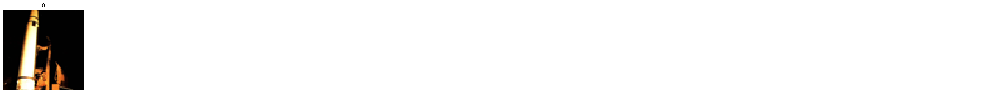

In [27]:
group = 'mixture-color-deep-no-skip-subset'
ids = torch.randint(0,len(test_sets), (1,))
print(ids)
sigmas =np.linspace(0, 250, 5).astype(int)
inp_ims = test_sets[ids[0]][0:1]


if 'gray' in group.split('-'): 
    show_im_set(inp_ims.mean(dim = 1, keepdim = True)[0:1],  n_columns=10)
else: 
    show_im_set(inp_ims[0:1],  n_columns=10)
    
inp_ims = torch.tile(inp_ims, (30,1,1,1))


if 'gray' in group.split('-'): 
    inp_ims = inp_ims.mean(dim = 1, keepdim = True)


all_phis  = {}
noise = torch.randn_like(inp_ims)

for sig in sigmas: 
    
    noisy_inp_ims = inp_ims + noise * sig/255
    # phi_xc = get_channel_means(denoisers[group], x1=noisy_inp_ims, x2=None,
                              # average_phi=False,with_params=False , return_activations=False)
    phi_xc = get_activation_means_unconditional(denoisers[group], noisy_inp_ims, noGrad=True)
    
    all_phis[sig] = phi_xc
    

0 participation ratio:  0.07421846687793732 , norm zero:  203.0
62 participation ratio:  0.2684735655784607 , norm zero:  334.0
125 participation ratio:  0.2862969934940338 , norm zero:  369.0
187 participation ratio:  0.29588794708251953 , norm zero:  395.0
250 participation ratio:  0.3039539158344269 , norm zero:  424.0


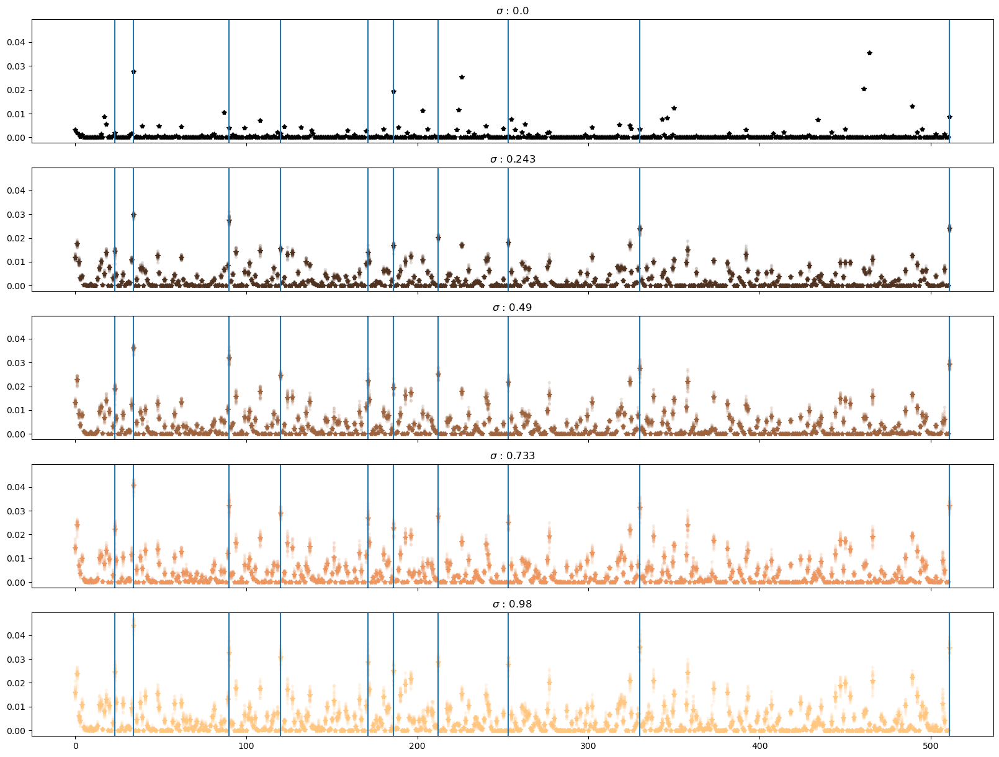

In [28]:
b = 3
f , axs = plt.subplots(len(sigmas),1 ,figsize=(20, len(sigmas)* 3), sharex = True, sharey=True)
colormap = plt.cm.copper 
plot_colors = [colormap(i) for i in np.linspace(0, 1,len(sigmas))]
for j in range(len(sigmas)):
    sig = sigmas[j]
    for i in range(all_phis[sig][b].shape[1]):
        axs[j].plot( torch.ones(all_phis[sig][b].shape[0]) *i , all_phis[sig][b][:, i].cpu().flatten(),  '.-', alpha = .1 , color= plot_colors[j] )
        axs[j].plot( i , all_phis[sig][b][:, i].mean().cpu(),  '*-', alpha = 1, color= plot_colors[j]  )
        axs[j].set_title( '$\sigma$ : ' + str(np.round(sig/255  ,3)))
    for m in range(10):
        axs[j].axvline( all_phis[sigmas[-1]][b].mean(dim = (0)).argsort(descending=True).cpu()[m]  )    
    participation_ratio = (all_phis[sig][b].mean(dim = (0)).norm(1)**2 / all_phis[sig][b].mean(dim = (0)).norm(2)**2 )/all_phis[sig][b].shape[1]
    print(sig , 'participation ratio: ', participation_ratio.item(), ', norm zero: ',all_phis[sig][b].mean(dim = (0)).norm(0).item() )


## 1.2) How does  $\mathbb{E}_z[\phi_{\sigma}(y)]$ change  as a function of noise level $\sigma$

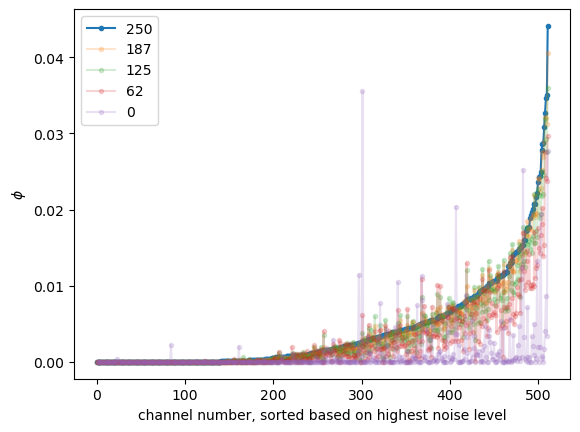

In [29]:
plt.plot(all_phis[sigmas[4]][3].mean(dim = (0)).cpu().sort()[0], '.-',label=sigmas[4])
plt.plot(all_phis[sigmas[3]][3].mean(dim = (0)).cpu()[all_phis[sigmas[4]][3].mean(dim = (0)).cpu().sort()[1]], '.-', alpha = .2,label=sigmas[3])
plt.plot(all_phis[sigmas[2]][3].mean(dim = (0)).cpu()[all_phis[sigmas[4]][3].mean(dim = (0)).cpu().sort()[1]], '.-', alpha = .2,label=sigmas[2])
plt.plot(all_phis[sigmas[1]][3].mean(dim = (0)).cpu()[all_phis[sigmas[4]][3].mean(dim = (0)).cpu().sort()[1]], '.-', alpha = .2,label=sigmas[1])
plt.plot(all_phis[sigmas[0]][3].mean(dim = (0)).cpu()[all_phis[sigmas[4]][3].mean(dim = (0)).cpu().sort()[1]], '.-', alpha = .2,label=sigmas[0])
plt.xlabel('channel number, sorted based on highest noise level')
plt.ylabel(r'$\phi$')
plt.legend()

### Representation becomes more dense at higher noise levels: are the active channels nested across noise levels? 


In [30]:
sigmas =np.linspace(0, 255, 5).astype(int)
b = 5

all_counts = {}
all_counts_ab = {}
all_counts_ba ={}

for i in range(len(sigmas)-1): 
    all_counts[i] = []
    all_counts_ab[i] = []
    all_counts_ba[i] = []
    
for _ in range(500): 
    
    ids = torch.randint(0,len(test_sets), (1,))
    inp_ims = torch.tile(test_sets[ids[0]][0:1], (10,1,1,1))
    
    noise = torch.randn_like(inp_ims)
    
    all_phis  = {}    
    all_sets =[]
    for sig in sigmas: 
        
        noisy_inp_ims = inp_ims + noise * sig/255
        # phi_xc = get_channel_means(denoisers[group], x1=noisy_inp_ims, x2=None,
                                  # average_phi=False,with_params=False , return_activations=False)
        phi_xc = get_activation_means_unconditional(denoisers[group], noisy_inp_ims, noGrad=True)    
        all_phis[sig] = phi_xc
    
    
        stop_id = int(all_phis[sig][b].mean(dim = (0)).norm(1)**2 / all_phis[sig][b].mean(dim = (0)).norm(2)**2 )
        all_sets.append(set((all_phis[sig][b].mean(dim = (0)).argsort(descending=True).cpu()[0:stop_id ]).tolist()))
    
    for i in range(len(all_sets)-1 ): 
        den = (len(all_sets[i]) + len(all_sets[i+1]) )        
        count = len(all_sets[i].symmetric_difference(all_sets[i+1]))
        count_ab=  len(all_sets[i+1] - all_sets[i])
        count_ba = len(all_sets[i] - all_sets[i+1])
        all_counts[i].append(round(100* count / den ))    
        all_counts_ab[i].append(round(100* count_ab / den ))
        all_counts_ba[i].append(round(100* count_ba / den ))


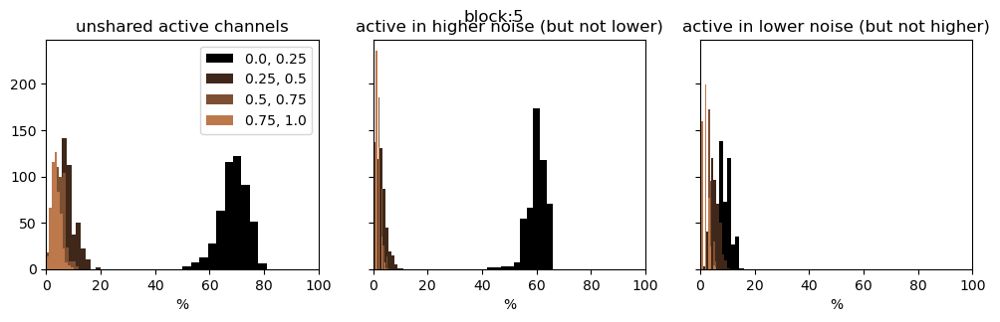

In [31]:
colormap = plt.cm.copper #nipy_spectral, Set1,Paired   
plot_colors = [colormap(i) for i in np.linspace(0, 1, 6)]

f , axs= plt.subplots(1,3, figsize = (12, 3), sharex=True, sharey=True)
f.suptitle('block:'+ str(b))
for k,v in all_counts.items():
    axs[0].hist(v, color=plot_colors[k], bins=10, alpha = 1, label= f"{round(sigmas[k]/255 ,2)}, {round(sigmas[k+1]/255, 2)}"  )
    axs[0].set_xlim(0,100)
    axs[0].set_title('unshared active channels')
    axs[0].legend()
    axs[0].set_xlabel('%')    
for k,v in all_counts_ab.items():
    axs[1].hist(v, color=plot_colors[k], bins=10, alpha = 1)
    axs[1].set_title('active in higher noise (but not lower)')
    axs[1].set_xlabel('%')
for k,v in all_counts_ba.items():
    axs[2].hist(v, color=plot_colors[k], bins=10, alpha = 1)
    axs[2].set_title('active in lower noise (but not higher)')
    axs[2].set_xlabel('%')

### How similar the $\phi$'s at two $\sigma$'s are? 

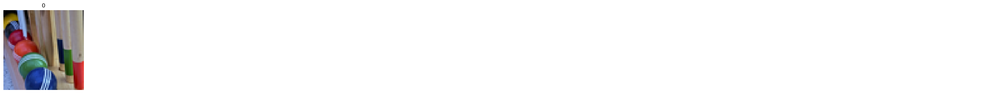

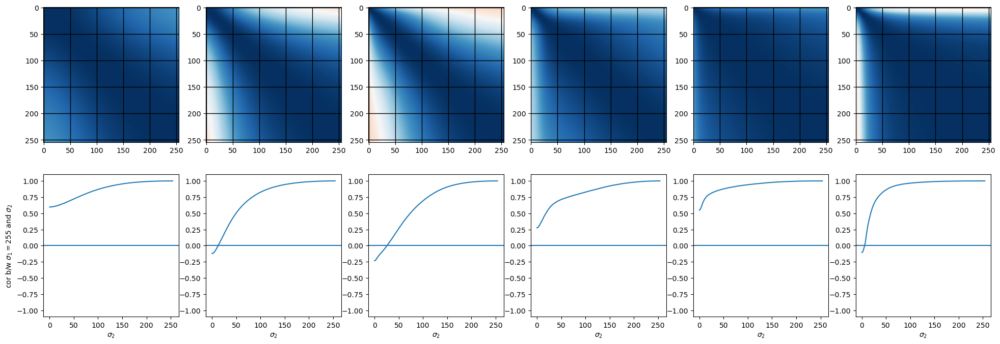

In [32]:
### average response per channel for different images from different classes (instead of pairwise response, we look at responses of many more classes )
ids = torch.randint(0,len(test_sets), (1,))
inp_ims = test_sets[ids[0]][0:1]



if 'gray' in group.split('-'): 
    show_im_set(inp_ims.mean(dim = 1, keepdim = True),  n_columns=10)
else: 
    show_im_set(inp_ims,  n_columns=10)
    
# inp_ims = train['inp'][0:200]
# inp_ims = train_sets[1]

# inp_ims = torch.tile(inp_ims, (20,1,1,1))

if 'gray' in group.split('-'): 
    inp_ims = inp_ims.mean(dim = 1, keepdim = True)

sigmas= range(0,255)
# sigmas= torch.logspace(.01,2.4,255)

all_phis  = {}
noise = torch.randn_like(inp_ims)

for sig in sigmas: 
    
    noisy_inp_ims = inp_ims + noise * sig/255
    # phi_xc = get_channel_means(denoisers[group], x1=noisy_inp_ims, x2=None,
                              # average_phi=True,with_params=False , return_activations=False)
    
    phi_xc = get_activation_means_unconditional(denoisers[group], noisy_inp_ims, noGrad=True)
    all_phis[sig] = phi_xc

### plot
f, axs = plt.subplots(2,len(all_phis[sig]), figsize = (24,8))

for b in range( len(all_phis[sig] )):
    temp = torch.corrcoef(torch.stack([all_phis[sig][b].flatten() for sig in sigmas]))

    axs[0,b].imshow(temp.cpu(), 'RdBu',vmin=-1 ,vmax = 1)
    # (all_phis[10][3].flatten() == 0).sum()
    # axs.tick_params(bottom=False,top = False, right = False, left=False)    
    axs[0,b].set_xticks(sigmas[0::50])  ;
    axs[0,b].set_yticks(sigmas[0::50]);
    axs[0,b].grid(color='k', linestyle='-', linewidth=1)
    axs[1,b].plot(temp[-1,:].cpu())
    # axs[1,b].plot(temp[torch.triu(torch.tril(temp, diagonal=1) , diagonal=1) !=0].cpu())    
    axs[1,b].set_ylim(-1.1,1.1)
    axs[1,b].axhline(0)    
    axs[1,b].set_xlabel('$\sigma_2$')    
axs[1,0].set_ylabel('cor b/w $\sigma_1=255$ and $\sigma_2$');    


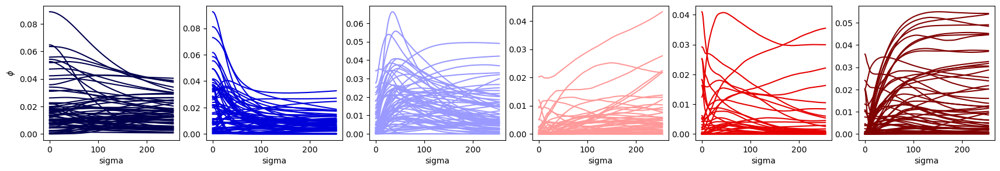

In [33]:
# sc = plt.cm.copper #nipy_spectral, Set1,Paired   
plot_colors = [scale_colormap(i) for i in np.linspace(0, 1, 6)]

f, axs = plt.subplots(1,len(phi_xc), figsize=(len(phi_xc)*3.5, 3 ) )
for b in range(len(phi_xc)):
    for i in range(0, phi_xc[0].shape[1] ): 
        axs[b].plot(sigmas, torch.tensor([all_phis[sig][b].mean(dim = 0).squeeze()[i]  for sig in sigmas] ),
                    alpha = 1 , color = plot_colors[b])

    axs[b].set_xlabel('sigma')
    axs[0].set_ylabel('$\phi$')


In [34]:
## for many images 
# noise = torch.randn(1,3,64,64)
ids = torch.randint(0,len(test_sets_cat), (100,))
inp_ims = test_sets_cat[ids]

if 'gray' in group.split('-'): 
    inp_ims = inp_ims.mean(dim = 1, keepdim = True)

sigmas= range(0,256, 1)

all_phis  = {}

for sig in sigmas: 
    sigs = (sig/255) * torch.ones(inp_ims.shape[0],1,1,1)
    phi_xc = phi_c_noise_averaged(denoisers[group], x_c=inp_ims, sigs=sigs, n_noise=5 ) 

    # phi_xc = get_channel_means(denoisers[group], x1=noisy_inp_ims, average_phi=False)    
    all_phis[sig] = phi_xc


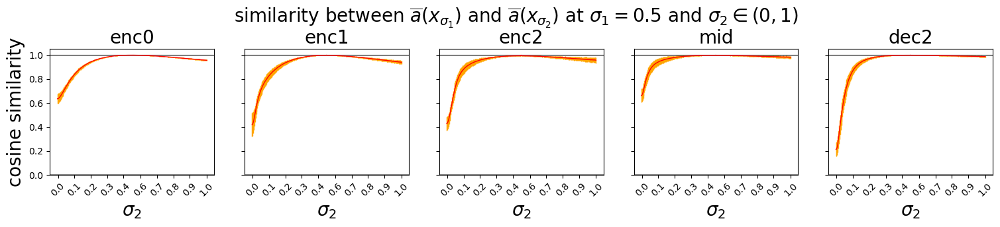

In [35]:


all_corrs = {}
for b in range(1,6):
    temp = torch.stack([all_phis[sig][b].squeeze() for sig in sigmas])
    
    all_corrs[b] = []
    for i in range(len(inp_ims)): 
        # all_corrs[b].append(torch.corrcoef(temp[:,i,:]))
        all_corrs[b].append(similarity_matrix(temp[:,i,:]))
    all_corrs[b] = torch.stack(all_corrs[b])

### plot 
f, axs = plt.subplots(1,len(all_phis[sig])-1, figsize = (15,3), sharey=True, sharex=True)
f.suptitle('similarity between $\overline{a}(x_{\sigma_1})$ and $\overline{a}(x_{\sigma_2})$ at $\sigma_1=0.5$ and $\sigma_2 \in (0,1)$', fontsize = 20)
# 
plt.tight_layout()

for b in range(1,6):
    axs[b-1].errorbar(range(0,256) ,all_corrs[b][:, 127, :].mean(dim = 0).cpu() , yerr=all_corrs[b][:, 127, :].std(dim = 0).cpu() ,lw=1 ,
                    elinewidth = 1, color='red', ecolor = 'orange' )
    axs[b-1].set_ylim(0,1.05)
    axs[b-1].axhline(0, color='black', alpha = .5)    
    axs[b-1].axhline(1, color='black', alpha = .5)        
    axs[b-1].set_xlabel('$\sigma_2$', fontsize = 20)    
    axs[b-1].set_title(block_names[group][b-1],fontsize = 20)
    axs[b-1].set_xticks(ticks=(torch.linspace(1,255, 10)).int(), labels= np.round(np.linspace(1,255, 10)/255, 1), rotation=45  );
    
axs[0].set_ylabel('cosine similarity', fontsize = 20);   
# plt.savefig('../results/unet_phi_sigma_dependence_row.pdf',bbox_inches='tight')    


#  Sparsity of representation $\bar{a}_j$

In [36]:
a_bars = {}
for group in groups: 
    print(group)
    a_bars[group] = torch.load('../results/a_bar_noise_ave_validation_full_'+group+'_imagenet64x64.pt', weights_only = True)


mixture-color-deep-no-skip-full
mixture-color-deep-no-skip-subset


In [37]:
sigmas = list(a_bars[group].keys())
if sigmas[-1] < sigmas[0]:
    sigmas.reverse()
sigmas

[0, 10, 50, 150, 255]

In [38]:


phis = {}
for group in groups:
    phis[group] ={}
    for sig in a_bars[group].keys():
        mid = int(len(layers[group])/2)
        phis[group][sig] = [a_bars[group][sig][i][:, sum(layers[group][0:mid]): sum(layers[group][0:mid+1]) ] for i in range(len(a_bars[group][sig]))]


In [39]:

# ch_selectivity=torch.cat(phis[group][sig]).norm(1, dim = 0).cpu()**2 / torch.cat(phis[group][sig]).norm(2, dim = 0).cpu()**2/torch.cat(phis[group][sig]).shape[0]
ch_selectivity = {}
ids_selectivity_sorted = {}
for group in groups:
    ch_selectivity[group] = {}
    ids_selectivity_sorted[group] = {}
    for sig in sigmas:
        
        ch_selectivity[group][sig] = participation_ratio_dataset(torch.cat(phis[group][sig]).T.cpu())
        ch_selectivity[group][sig]= torch.nan_to_num(ch_selectivity[group][sig], nan=0.0)
        ids_selectivity_sorted[group][sig] = ch_selectivity[group][sig].sort(descending =True)[1]
        



## Always off channels 

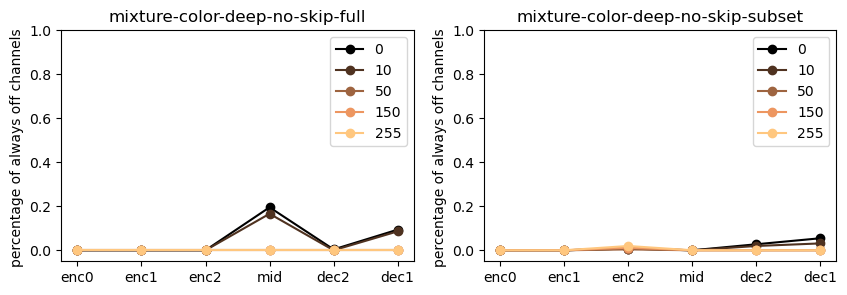

In [40]:
f, axs = plt.subplots(1, len(groups), figsize = ( len(groups)*5, 3) )

j = 0
for group in groups:
    off_channels = {}
    for sig in sigmas:
        off_channels[sig] = []
        k1 = 0
        for l in layers[group]: 
            phi_block = torch.cat(a_bars[group][sig])[:,k1:k1 + l]
            off_channels[sig].append((phi_block.sum(dim = 0) == 0).sum().item())
            k1 += l  
            
    plot_colors = [noise_colormap(i) for i in np.linspace(0, 1, len(sigmas ))]
    
    c = 0
    for sig in sigmas:    
        axs[j].plot(block_names[group], torch.tensor(off_channels[sig])/torch.tensor(layers[group]), '-o', color = plot_colors[c],  label = sig)
        c+= 1
    axs[j].set_ylabel('percentage of always off channels ');
    axs[j].set_ylim(-.05,1)
    axs[j].legend();
    axs[j].set_title(group);
    j += 1

mixture-color-deep-no-skip-full
mixture-color-deep-no-skip-subset


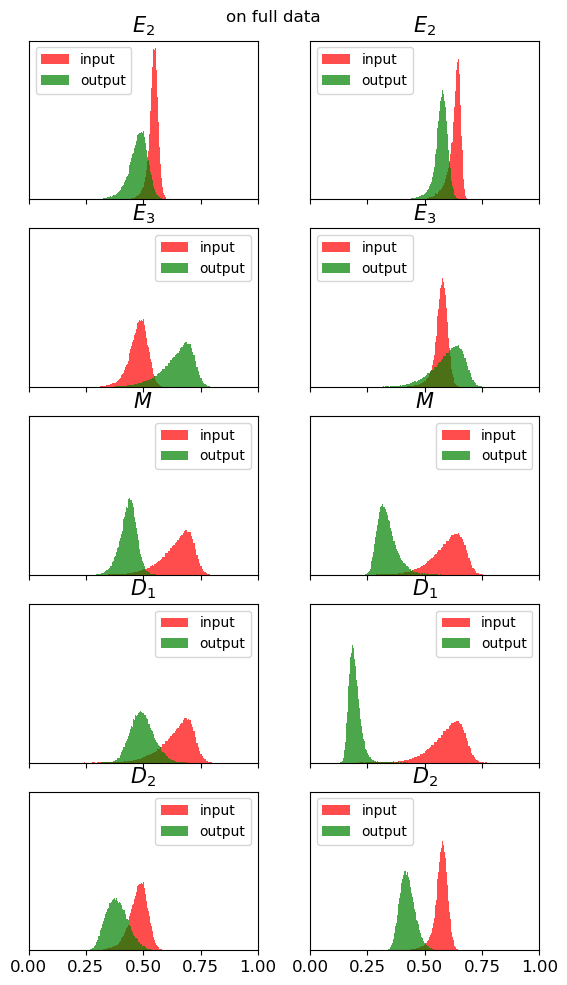

In [47]:
f,axs = plt.subplots( len(layers[group])-1, len(groups), figsize = (len(groups)*3, (len(layers[group])-1) *2 ) , sharey=True,sharex=True)
f.suptitle('on full data')
plt.tight_layout()
sig = 150
c = 0
for group in groups:
    k1 = 0
    all_participation_ratio = []
    for l in layers[group]: 
            phi_block = torch.cat(a_bars[group][sig])[:,k1:k1 + l]
            all_participation_ratio.append(participation_ratio_dataset(phi_block))
            k1 += l  
            # print( 'Number of channels that never are activated at sigma ', sig, ': ', (phi_block.sum(dim = 0) == 0).sum().item(), )     
    
    block_pairs = {'$E_2$': (0,1) , 
              '$E_3$': (1,2), 
              '$M$': (2,3), 
              '$D_1$': (2,4),
              '$D_2$':(1,5)}
    plt.rc('xtick', labelsize=12)       
    r = 0
    for b, pairs in block_pairs.items():
        # f, ax = plt.subplots(1,1, figsize = (3,2))
        
        axs[r,c].hist( all_participation_ratio[pairs[0]] ,alpha = .7, color='red', label = 'input', density=True, bins=100)
        axs[r,c].hist( all_participation_ratio[pairs[1]] ,alpha = .7, color='green', label = 'output', density=True, bins=100 )
        axs[r,c].set_title(b, fontsize=15 );
        # ax.set_xlabel('participation ratio', fontsize=15 );
        axs[r,c].set_xlim(0,1)
        axs[r,c].set_yticks([])
        axs[r,c].set_yticks([])    
        axs[r,c].legend();
        r += 1
        # plt.savefig('../results/participation_ratios_unet_hist_'+b.split('$')[1]+'_.pdf',bbox_inches='tight')    
    print(group)    
    c += 1

mixture-color-deep-no-skip-full
mixture-color-deep-no-skip-subset


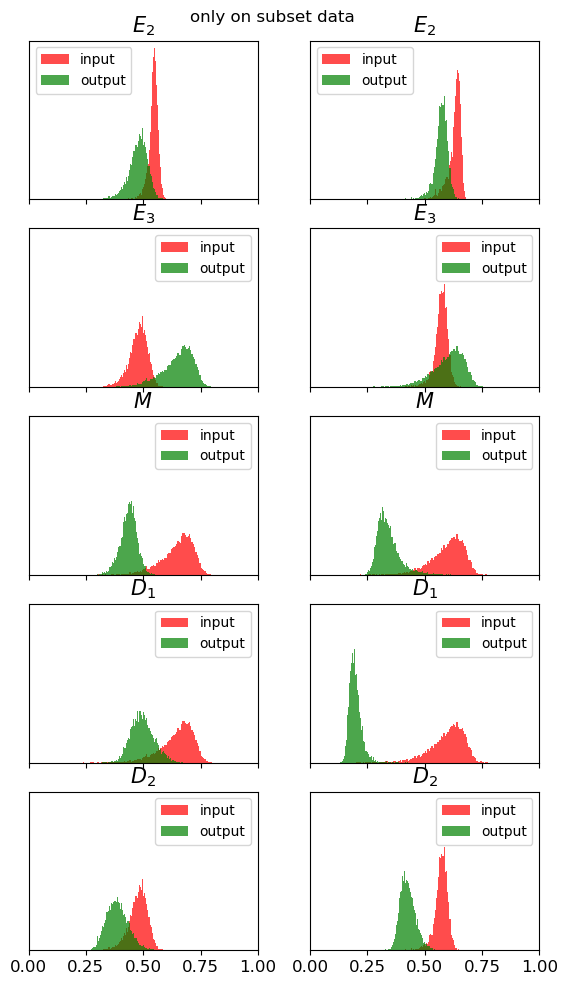

In [48]:
f,axs = plt.subplots( len(layers[group])-1, len(groups), figsize = (len(groups)*3, (len(layers[group])-1) *2 ) , sharey=True,sharex=True)
f.suptitle('only on subset data')
plt.tight_layout()

sig = 150
c = 0
for group in groups:
    k1 = 0
    all_participation_ratio = []
    for l in layers[group]: 
            phi_block = torch.cat([a_bars[group][sig][i] for i in imagenet_subset_ids ])[:,k1:k1 + l]
            all_participation_ratio.append(participation_ratio_dataset(phi_block))
            k1 += l  
            # print( 'Number of channels that never are activated at sigma ', sig, ': ', (phi_block.sum(dim = 0) == 0).sum().item(), )     
    
    block_pairs = {'$E_2$': (0,1) , 
              '$E_3$': (1,2), 
              '$M$': (2,3), 
              '$D_1$': (2,4),
              '$D_2$':(1,5)}
    plt.rc('xtick', labelsize=12)       
    r = 0
    for b, pairs in block_pairs.items():
        # f, ax = plt.subplots(1,1, figsize = (3,2))
        
        axs[r,c].hist( all_participation_ratio[pairs[0]] ,alpha = .7, color='red', label = 'input', density=True, bins=100)
        axs[r,c].hist( all_participation_ratio[pairs[1]] ,alpha = .7, color='green', label = 'output', density=True, bins=100 )
        axs[r,c].set_title(b, fontsize=15 );
        # ax.set_xlabel('participation ratio', fontsize=15 );
        axs[r,c].set_xlim(0,1)
        axs[r,c].set_yticks([])
        axs[r,c].set_yticks([])    
        axs[r,c].legend();
        r += 1
        # plt.savefig('../results/participation_ratios_unet_hist_'+b.split('$')[1]+'_.pdf',bbox_inches='tight')    
    print(group)    
    c += 1

## How does channel sparsity change at different noise levels and for different images? 

Mid block: On average, representation becomes more dense with noise level. 


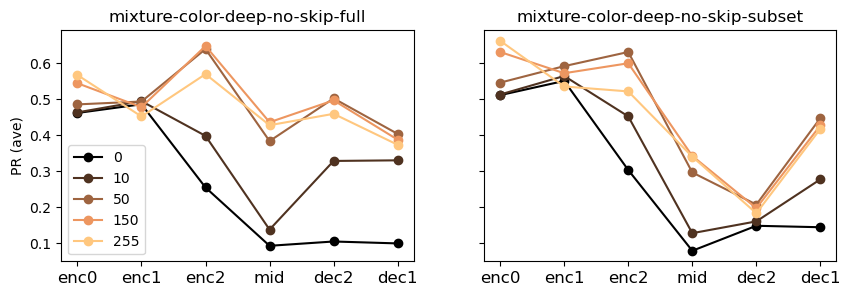

In [50]:
plot_colors = [noise_colormap(i) for i in np.linspace(0, 1, len(a_bars[group ].keys()))]
f, axs = plt.subplots(1, len(groups), figsize = ( len(groups)*5, 3) , sharey=True)

j = 0
for group in groups:
    c = 0
    for sig in sigmas:
        k1 = 0
        all_participation_ratio_mean = []
        for l in layers[group]: 
                phi_block = torch.cat([a_bars[group][sig][i] for i in imagenet_subset_ids ])[:,k1:k1 + l]
                all_participation_ratio_mean.append(participation_ratio_dataset(phi_block).mean() )
                k1 += l  
        
        axs[j].plot(block_names[group], all_participation_ratio_mean, '-o', color = plot_colors[c],  label = sig)
        axs[j].set_title(group)
        c+= 1
    j +=1
axs[0].set_ylabel('PR (ave)');
axs[0].legend();
 

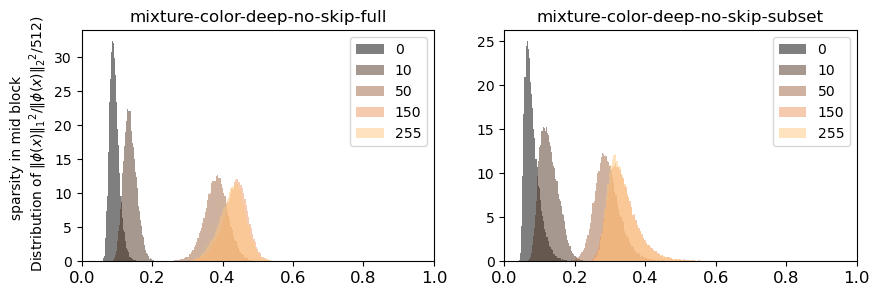

In [51]:
## change in sparsity as a function of noise level 
f, axs = plt.subplots(1, len(groups), figsize = ( len(groups)*5, 3) )
j = 0
for group in groups:
    c = 0
    for sig in sigmas:
        # pr=torch.cat(phis[sig]).norm(1, dim = 1).cpu()**2 / torch.cat(phis[sig]).norm(2, dim = 1).cpu()**2/torch.cat(phis[sig]).shape[1]
        pr = participation_ratio_dataset(torch.cat(a_bars[group][sig])[:, sum(layers[group][0:3]):sum(layers[group][0:4])].cpu()) 
        
        axs[j].hist(pr, alpha = .5, label = sig, bins = 100, density=True, color=plot_colors[c]);    
        axs[j].legend()
        c +=1
    axs[j].set_xlim(0,1);
    axs[j].set_title(group)
    j += 1
axs[0].set_ylabel('sparsity in mid block \n Distribution of ${\Vert \phi(x) \Vert_1}^2/{\Vert \phi(x) \Vert_2}^2/512$)')   ;
    

## Track change in sparsity across blocks for each image

In [68]:
group = 'mixture-color-deep-no-skip-subset'


In [69]:
a_bars_cat_prs = {}
for sig in sigmas :
    a_bars_cat = torch.cat(a_bars[group][sig] )
    
    a_bars_cat_prs[sig] = []
    k1 = 0
    
    for l in layers[group]: 
        phi_block = a_bars_cat[:,k1:k1 + l]
        a_bars_cat_prs[sig].append(participation_ratio_dataset(phi_block) )
        k1 += l  
    

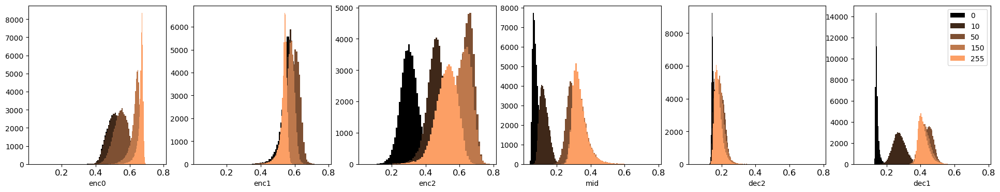

In [70]:
plot_colors = [noise_colormap(i) for i in np.linspace(0, 1,6)]
f, axs = plt.subplots(1,len(layers[group]), figsize= (len(layers[group])*4, 4 ), sharex=True)
for i in range(6):
    j = 0
    for sig in sigmas:
        axs[i].hist(a_bars_cat_prs[sig][i] ,color = plot_colors[j], bins = 50, label = sigmas[j])
        j += 1
        axs[i].set_xlabel(block_names[group][i])
        
plt.legend();

lowest PR in  mid


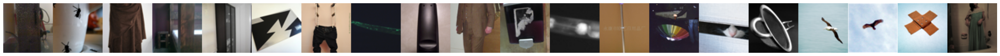

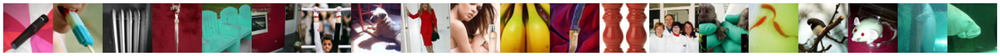

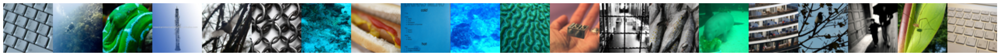

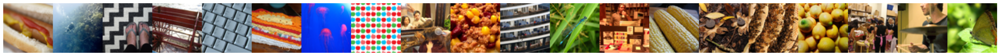

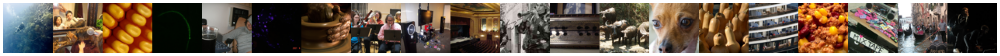

highest PR in  mid


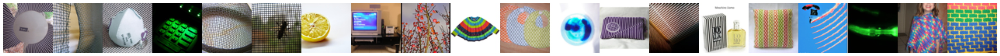

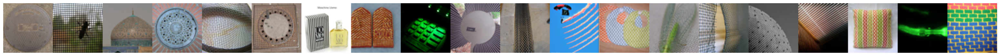

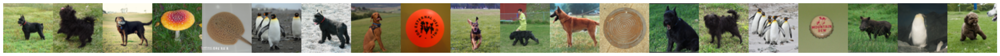

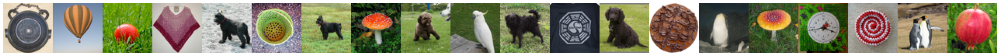

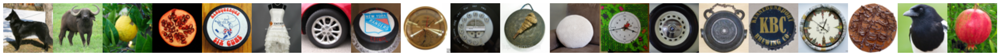

In [71]:
b = 3
print( 'lowest PR in ' , block_names[group][b])
for sig in sigmas:
    ids = a_bars_cat_prs[sig][b].sort()[1]
    show_im_grid(test_sets_cat[ids[0:20] ], n_columns=20 , )

print( 'highest PR in ' , block_names[group][b] )
for sig in sigmas:
    ids = a_bars_cat_prs[sig][b].sort()[1]  
    show_im_grid(test_sets_cat[ids[-20::] ], n_columns=20 )

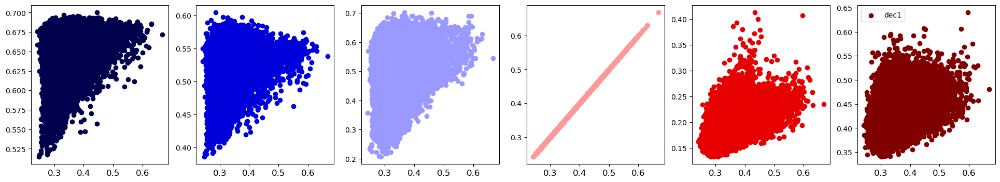

In [72]:
plot_colors = [scale_colormap(i) for i in np.linspace(0, 1,6)]
f, axs = plt.subplots(1,len(layers[group]), figsize= (len(layers[group])*4, 4 ), sharey=False)

for i in range(6):
    axs[i].scatter( a_bars_cat_prs[sig][3], a_bars_cat_prs[sig][i] ,color = plot_colors[i],  label = block_names[group][i])
plt.legend();

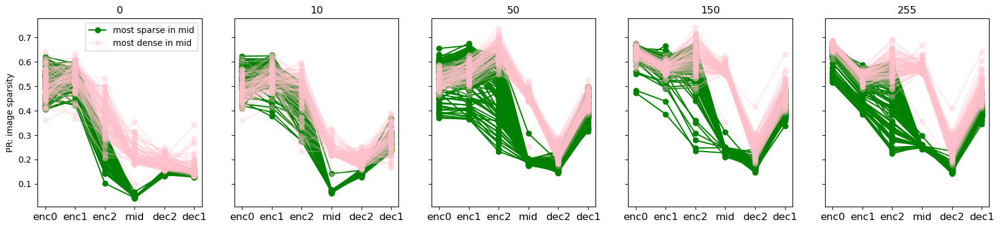

In [73]:
group = 'mixture-color-deep-no-skip-subset'


f, axs = plt.subplots(1,len(sigmas), figsize= (len(sigmas)*4, 4 ), sharey=True)
i = 0
for sig in sigmas :
    a_bars_cat = torch.cat(a_bars[group][sig] )
    
    a_bars_cat_prs = []
    k1 = 0
    
    for l in layers[group]: 
        phi_block = a_bars_cat[:,k1:k1 + l]
        a_bars_cat_prs.append(participation_ratio_dataset(phi_block) )
        k1 += l  
    
    
    ids = a_bars_cat_prs[3].sort()[1] # sort based on the mid block PR 
    
    for im_n in ids[0:100] :
        axs[i].plot(block_names[group], torch.stack([a_bars_cat_prs[l][im_n] for l in range(len(a_bars_cat_prs)) ]),'-o', color='green')
        
    axs[i].plot(block_names[group], torch.stack([a_bars_cat_prs[l][0] for l in range(len(a_bars_cat_prs)) ]),'-o', color='green', alpha = 1, label = 'most sparse in mid')
    
    for im_n in ids[-100:] :
        axs[i].plot(block_names[group], torch.stack([a_bars_cat_prs[l][im_n] for l in range(len(a_bars_cat_prs)) ]),'-o', color='pink', alpha = .3)
    
    
    axs[i].plot(block_names[group], torch.stack([a_bars_cat_prs[l][-1] for l in range(len(a_bars_cat_prs)) ]),'-o', color='pink', alpha = .3, label = 'most dense in mid')
    axs[i].set_title(sig)
    i += 1
axs[0].legend()
axs[0].set_ylabel('PR: image sparsity');


dog images are the most dense in mid block. Is it becuase there is more of them in the training dataset? Maybe imagenet is not very good for this puropse, becuase of the imbalance in the classes. Use MS COCO dataset 